In [1]:
import numpy as np
import matplotlib.pyplot as plt

import mne
from mne.datasets.sleep_physionet.age import fetch_data
from mne.time_frequency import psd_welch

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer

In [2]:
alice_files, bob_files

NameError: name 'alice_files' is not defined

In [ ]:
ALICE, BOB = 0, 1
[alice_files, bob_files] = fetch_data(subjects=[ALICE, BOB], recording=[1])

mapping = {'EOG horizontal': 'eog',
           'Resp oro-nasal': 'misc',
           'EMG submental': 'misc',
           'Temp rectal': 'misc',
           'Event marker': 'misc'}

raw_train = mne.io.read_raw_edf(alice_files[0])
annot_train = mne.read_annotations(alice_files[1])

raw_train.set_annotations(annot_train, emit_warning=False)
raw_train.set_channel_types(mapping)

# plot some data
raw_train.plot(duration=60, scalings='auto')

Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']


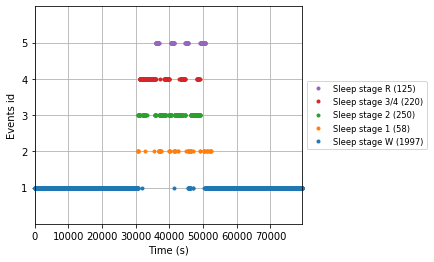

In [3]:
annotation_desc_2_event_id = {'Sleep stage W': 1,
                              'Sleep stage 1': 2,
                              'Sleep stage 2': 3,
                              'Sleep stage 3': 4,
                              'Sleep stage 4': 4,
                              'Sleep stage R': 5}

events_train, _ = mne.events_from_annotations(
    raw_train, event_id=annotation_desc_2_event_id, chunk_duration=30.)

# create a new event_id that unifies stages 3 and 4
event_id = {'Sleep stage W': 1,
            'Sleep stage 1': 2,
            'Sleep stage 2': 3,
            'Sleep stage 3/4': 4,
            'Sleep stage R': 5}

# plot events
mne.viz.plot_events(events_train, event_id=event_id,
                    sfreq=raw_train.info['sfreq'])

# keep the color-code for further plotting
stage_colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

In [4]:
tmax = 30. - 1. / raw_train.info['sfreq']  # tmax in included

epochs_train = mne.Epochs(raw=raw_train, events=events_train,
                          event_id=event_id, tmin=0., tmax=tmax, baseline=None)

print(epochs_train)

2650 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
<Epochs  |   2650 events (good & bad), 0 - 29.99 sec, baseline off, ~19 kB, data not loaded,
 'Sleep stage 1': 58
 'Sleep stage 2': 250
 'Sleep stage 3/4': 220
 'Sleep stage R': 125
 'Sleep stage W': 1997>


In [5]:
raw_test = mne.io.read_raw_edf(bob_files[0])
annot_test = mne.read_annotations(bob_files[1])
raw_test.set_annotations(annot_test, emit_warning=False)
raw_test.set_channel_types(mapping)
events_test, _ = mne.events_from_annotations(
    raw_test, event_id=annotation_desc_2_event_id, chunk_duration=30.)
epochs_test = mne.Epochs(raw=raw_test, events=events_test, event_id=event_id,
                         tmin=0., tmax=tmax, baseline=None)

print(epochs_test)

Extracting EDF parameters from /home/parietal/sfreybur/mne_data/physionet-sleep-data/SC4011E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']
2802 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
<Epochs  |   2802 events (good & bad), 0 - 29.99 sec, baseline off, ~19 kB, data not loaded,
 'Sleep stage 1': 109
 'Sleep stage 2': 562
 'Sleep stage 3/4': 105
 'Sleep stage R': 170
 'Sleep stage W': 1856>


Loading data for 58 events and 3000 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Loading data for 250 events and 3000 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Loading data for 220 events and 3000 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Loading data for 125 events and 3000 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Loading data for 1997 events and 3000 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Loading data for 109 events and 3000 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS windows
Loading data for 562 events and 3000 original time points ...
0 bad epochs dropped
    Using multitaper spectrum estimation with 7 DPSS 

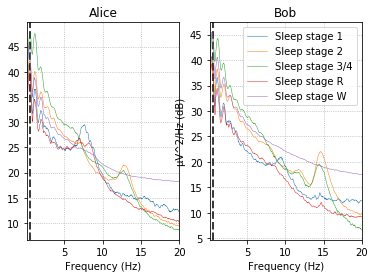

In [6]:
# visualize Alice vs. Bob PSD by sleep stage.
fig, (ax1, ax2) = plt.subplots(ncols=2)

# iterate over the subjects
stages = sorted(event_id.keys())
for ax, title, epochs in zip([ax1, ax2],
                             ['Alice', 'Bob'],
                             [epochs_train, epochs_test]):

    for stage, color in zip(stages, stage_colors):
        epochs[stage].plot_psd(area_mode=None, color=color, ax=ax,
                               fmin=0.1, fmax=20., show=False,
                               average=True, spatial_colors=False)
    ax.set(title=title, xlabel='Frequency (Hz)')
ax2.set(ylabel='µV^2/Hz (dB)')
ax2.legend(ax2.lines[2::3], stages)
plt.show()

In [7]:
def eeg_power_band(epochs):
    """EEG relative power band feature extraction.

    This function takes an ``mne.Epochs`` object and creates EEG features based
    on relative power in specific frequency bands that are compatible with
    scikit-learn.

    Parameters
    ----------
    epochs : Epochs
        The data.

    Returns
    -------
    X : numpy array of shape [n_samples, 5]
        Transformed data.
    """
    # specific frequency bands
    FREQ_BANDS = {"delta": [0.5, 4.5],
                  "theta": [4.5, 8.5],
                  "alpha": [8.5, 11.5],
                  "sigma": [11.5, 15.5],
                  "beta": [15.5, 30]}

    psds, freqs = psd_welch(epochs, picks='eeg', fmin=0.5, fmax=30.)
    # Normalize the PSDs
    psds /= np.sum(psds, axis=-1, keepdims=True)

    X = []
    for fmin, fmax in FREQ_BANDS.values():
        psds_band = psds[:, :, (freqs >= fmin) & (freqs < fmax)].mean(axis=-1)
        X.append(psds_band.reshape(len(psds), -1))

    return np.concatenate(X, axis=1)

In [8]:
pipe = make_pipeline(FunctionTransformer(eeg_power_band, validate=False),
                     RandomForestClassifier(n_estimators=100, random_state=42))

# Train
y_train = epochs_train.events[:, 2]
pipe.fit(epochs_train, y_train)

# Test
y_pred = pipe.predict(epochs_test)

# Assess the results
y_test = epochs_test.events[:, 2]
acc = accuracy_score(y_test, y_pred)

print("Accuracy score: {}".format(acc))

Loading data for 2650 events and 3000 original time points ...
0 bad epochs dropped
Effective window size : 2.560 (s)
Loading data for 2802 events and 3000 original time points ...
0 bad epochs dropped
Effective window size : 2.560 (s)
Accuracy score: 0.8468950749464668


## Braindecode

In [3]:
from braindecode.datasets.mne import (
    create_from_mne_raw, create_from_mne_epochs)

In [4]:
# 5, 6, 7, 10, 13, 14 are codes for executed and imagined hands/feet
subject_id = 22
event_codes = [5, 6, 9, 10, 13, 14]
# event_codes = [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

# This will download the files if you don't have them yet,
# and then return the paths to the files.
physionet_paths = mne.datasets.eegbci.load_data(
    subject_id, event_codes, update_path=False)

# Load each of the files
parts = [mne.io.read_raw_edf(path, preload=True, stim_channel='auto')
         for path in physionet_paths]

descriptions = [{"event_code": code, "subject": subject_id}
                for code in event_codes]
windows_datasets = create_from_mne_raw(
    parts,
    trial_start_offset_samples=0,
    trial_stop_offset_samples=0,
    window_size_samples=500,
    window_stride_samples=500,
    drop_last_window=False,
    descriptions=descriptions)

Using default location ~/mne_data for EEGBCI...
Using default location ~/mne_data for EEGBCI...
Using default location ~/mne_data for EEGBCI...
Using default location ~/mne_data for EEGBCI...
Using default location ~/mne_data for EEGBCI...
Using default location ~/mne_data for EEGBCI...
Extracting EDF parameters from /home/parietal/sfreybur/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S022/S022R05.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /home/parietal/sfreybur/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S022/S022R06.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...
Extracting EDF parameters from /home/parietal/sfreybur/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S022/S022R09.edf...
EDF file detected
Setting channel info structure...
Creating raw.info s

In [5]:
ALICE, BOB = 0, 1
[alice_files, bob_files] = fetch_data(subjects=[ALICE, BOB], recording=[1])

mapping = {'EOG horizontal': 'eog',
           'Resp oro-nasal': 'misc',
           'EMG submental': 'misc',
           'Temp rectal': 'misc',
           'Event marker': 'misc'}

raw_train = mne.io.read_raw_edf(alice_files[0])
annot_train = mne.read_annotations(alice_files[1])
annot_train.description[-1] = 'Sleep stage 1'
raw_train.set_annotations(annot_train, emit_warning=False)
raw_train.set_channel_types(mapping)

train_sample= create_from_mne_raw(
    [raw_train],
    trial_start_offset_samples=0,
    trial_stop_offset_samples=0,
    window_size_samples=500,
    window_stride_samples=500,
    drop_last_window=False)



Using default location ~/mne_data for PHYSIONET_SLEEP...
Extracting EDF parameters from /home/parietal/sfreybur/mne_data/physionet-sleep-data/SC4001E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']
15900 matching events found
No baseline correction applied
Adding metadata with 4 columns
0 projection items activated
Loading data for 15900 events and 500 original time points ...
0 bad epochs dropped


In [13]:
import inspect

In [21]:
train_sample.datasets[0]

<Epochs  |   15900 events (all good), 0 - 4.99 sec, baseline off, ~19 kB, data not loaded, with metadata,
 'Sleep stage 1': 348
 'Sleep stage 2': 1500
 'Sleep stage 3': 606
 'Sleep stage 4': 714
 'Sleep stage R': 750
 'Sleep stage W': 11982>

In [27]:
len(train_sample.datasets[0][0][0])

Loading data for 1 events and 500 original time points ...


7

In [22]:
inspect.getmembers(train_sample.datasets[0][0])

Loading data for 1 events and 500 original time points ...


[('__add__', <method-wrapper '__add__' of tuple object at 0x7f97ad389dc0>),
 ('__class__', tuple),
 ('__contains__',
  <method-wrapper '__contains__' of tuple object at 0x7f97ad389dc0>),
 ('__delattr__',
  <method-wrapper '__delattr__' of tuple object at 0x7f97ad389dc0>),
 ('__dir__', <function tuple.__dir__()>),
 ('__doc__',
  "Built-in immutable sequence.\n\nIf no argument is given, the constructor returns an empty tuple.\nIf iterable is specified the tuple is initialized from iterable's items.\n\nIf the argument is a tuple, the return value is the same object."),
 ('__eq__', <method-wrapper '__eq__' of tuple object at 0x7f97ad389dc0>),
 ('__format__', <function tuple.__format__(format_spec, /)>),
 ('__ge__', <method-wrapper '__ge__' of tuple object at 0x7f97ad389dc0>),
 ('__getattribute__',
  <method-wrapper '__getattribute__' of tuple object at 0x7f97ad389dc0>),
 ('__getitem__',
  <method-wrapper '__getitem__' of tuple object at 0x7f97ad389dc0>),
 ('__getnewargs__', <function tuple

In [12]:
raw_test = mne.io.read_raw_edf(bob_files[0])
annot_test = mne.read_annotations(bob_files[1])
annot_test.description[-1] = 'Sleep stage 1'
raw_test.set_annotations(annot_test, emit_warning=False)
raw_test.set_channel_types(mapping)
valid_sample = create_from_mne_raw(
    [raw_test],
    trial_start_offset_samples=0,
    trial_stop_offset_samples=0,
    window_size_samples=500,
    window_stride_samples=500,
    drop_last_window=False)

Extracting EDF parameters from /home/parietal/sfreybur/mne_data/physionet-sleep-data/SC4011E0-PSG.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Used Annotations descriptions: ['Sleep stage 1', 'Sleep stage 2', 'Sleep stage 3', 'Sleep stage 4', 'Sleep stage R', 'Sleep stage W']
16812 matching events found
No baseline correction applied
Adding metadata with 4 columns
0 projection items activated
Loading data for 16812 events and 500 original time points ...
0 bad epochs dropped


In [13]:
# splitted = windows_dataset.split('session')
# train_set = splitted['session_T']
# valid_set = splitted['session_E'] 

In [14]:
import torch
from braindecode.util import set_random_seeds
from braindecode.models import ShallowFBCSPNet

cuda = torch.cuda.is_available()  # check if GPU is available, if True chooses to use it
device = 'cuda' if cuda else 'cpu'
if cuda:
    torch.backends.cudnn.benchmark = True
seed = 20200220  # random seed to make results reproducible
# Set random seed to be able to reproduce results
set_random_seeds(seed=seed, cuda=cuda)

n_classes=6
# Extract number of chans and time steps from dataset
n_chans = train_sample[0][0].shape[0]
input_window_samples = train_sample[0][0].shape[1]

model = ShallowFBCSPNet(
    n_chans,
    n_classes,
    input_window_samples=input_window_samples,
    final_conv_length='auto',
)

# Send model to GPU
if cuda:
    model.cuda()

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...


In [15]:
from skorch.callbacks import LRScheduler
from skorch.helper import predefined_split
from braindecode import EEGClassifier
# These values we found good for shallow network:
lr = 0.0625 * 0.01
weight_decay = 0

# For deep4 they should be:
# lr = 1 * 0.01
# weight_decay = 0.5 * 0.001

batch_size = 64
n_epochs = 4

clf = EEGClassifier(
    model,
    criterion=torch.nn.NLLLoss,
    optimizer=torch.optim.AdamW,
    train_split=predefined_split(valid_sample),  # using valid_set for validation
    optimizer__lr=lr,
    optimizer__weight_decay=weight_decay,
    batch_size=batch_size,
    callbacks=[
        "accuracy", ("lr_scheduler", LRScheduler('CosineAnnealingLR', T_max=n_epochs - 1)),
    ],
    device=device,
)
# Model training for a specified number of epochs. `y` is None as it is already supplied
# in the dataset.
clf.fit(train_sample, y=None, epochs=n_epochs)

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

/home/parietal/sfreybur/miniconda3/lib/python3.7/site-packages/torch/optim/lr_scheduler.py:143: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
      3            0.7589        0.7466            0.6240        1.3768  119.9654
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points ...
Loading data for 1 events and 500 original time points .

<class 'braindecode.classifier.EEGClassifier'>[initialized](
  module_=ShallowFBCSPNet(
    (ensuredims): Ensure4d()
    (dimshuffle): Expression(expression=transpose_time_to_spat) 
    (conv_time): Conv2d(1, 40, kernel_size=(25, 1), stride=(1, 1))
    (conv_spat): Conv2d(40, 40, kernel_size=(1, 7), stride=(1, 1), bias=False)
    (bnorm): BatchNorm2d(40, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv_nonlin_exp): Expression(expression=square) 
    (pool): AvgPool2d(kernel_size=(75, 1), stride=(15, 1), padding=0)
    (pool_nonlin_exp): Expression(expression=safe_log) 
    (drop): Dropout(p=0.5, inplace=False)
    (conv_classifier): Conv2d(40, 6, kernel_size=(27, 1), stride=(1, 1))
    (softmax): LogSoftmax()
    (squeeze): Expression(expression=squeeze_final_output) 
  ),
)

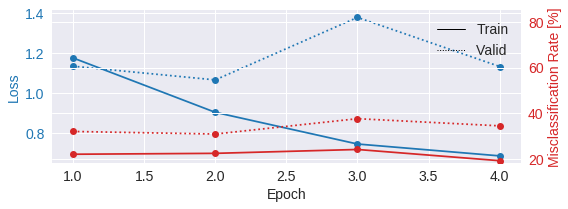

In [16]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import pandas as pd
# Extract loss and accuracy values for plotting from history object
results_columns = ['train_loss', 'valid_loss', 'train_accuracy', 'valid_accuracy']
df = pd.DataFrame(clf.history[:, results_columns], columns=results_columns,
                  index=clf.history[:, 'epoch'])

# get percent of misclass for better visual comparison to loss
df = df.assign(train_misclass=100 - 100 * df.train_accuracy,
               valid_misclass=100 - 100 * df.valid_accuracy)

plt.style.use('seaborn')
fig, ax1 = plt.subplots(figsize=(8, 3))
df.loc[:, ['train_loss', 'valid_loss']].plot(
    ax=ax1, style=['-', ':'], marker='o', color='tab:blue', legend=False, fontsize=14)

ax1.tick_params(axis='y', labelcolor='tab:blue', labelsize=14)
ax1.set_ylabel("Loss", color='tab:blue', fontsize=14)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

df.loc[:, ['train_misclass', 'valid_misclass']].plot(
    ax=ax2, style=['-', ':'], marker='o', color='tab:red', legend=False)
ax2.tick_params(axis='y', labelcolor='tab:red', labelsize=14)
ax2.set_ylabel("Misclassification Rate [%]", color='tab:red', fontsize=14)
ax2.set_ylim(ax2.get_ylim()[0], 85)  # make some room for legend
ax1.set_xlabel("Epoch", fontsize=14)

# where some data has already been plotted to ax
handles = []
handles.append(Line2D([0], [0], color='black', linewidth=1, linestyle='-', label='Train'))
handles.append(Line2D([0], [0], color='black', linewidth=1, linestyle=':', label='Valid'))
plt.legend(handles, [h.get_label() for h in handles], fontsize=14)
plt.tight_layout()

## Coding some transformations

In [30]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import warnings
warnings.filterwarnings("ignore")
plt.ion()   # interactive mode

In [ ]:
class FaceLandmarksDataset(Dataset):
    """Face Landmarks dataset."""

    def __init__(self, csv_file, root_dir, transform=None):
        """
        Args:
            csv_file (string): Path to the csv file with annotations.
            root_dir (string): Directory with all the images.
            transform (callable, optional): Optional transform to be applied
                on a sample.q
        """
        self.landmarks_frame = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.landmarks_frame)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        img_name = os.path.join(self.root_dir,
                                self.landmarks_frame.iloc[idx, 0])
        image = io.imread(img_name)
        landmarks = self.landmarks_frame.iloc[idx, 1:]
        landmarks = np.array([landmarks])
        landmarks = landmarks.astype('float').reshape(-1, 2)
        sample = {'image': image, 'landmarks': landmarks}

        if self.transform:
            sample = self.transform(sample)

        return sample

In [ ]:
import numpy as np
import pandas as pd

from torch.utils.data import Dataset, ConcatDataset


class BaseDataset(Dataset):
    """A base dataset holds a mne.Raw, and a pandas.DataFrame with additional
    description, such as subject_id, session_id, run_id, or age or gender of
    subjects.

    Parameters
    ----------
    raw: mne.io.Raw
    description: dict | pandas.Series | None
        holds additional description about the continuous signal / subject
    target_name: str | None
        name of the index in `description` that should be use to provide the
        target (e.g., to be used in a prediction task later on).
    """
    def __init__(self, raw, description=None, target_name=None, transform=None):
        self.raw = raw
        self.transform = transform
        if description is not None:
            if (not isinstance(description, pd.Series)
                and not isinstance(description, dict)):
                raise ValueError(
                    f"'{description}' has to be either a pandas.Series or a dict")
            if isinstance(description, dict):
                description = pd.Series(description)
        self.description = description

        if target_name is None:
            self.target = None
        elif target_name in self.description:
            self.target = self.description[target_name]
        else:
            raise ValueError(f"'{target_name}' not in description.")

    def __getitem__(self, index):
        
        data = self.raw[:, index][0]
        if self.transform:
            data = self.transform(data)
        return data, self.target
        
    def __len__(self):
        return len(self.raw)
        

class WindowsDataset(BaseDataset):
    """Applies a windower to a base dataset.

    Parameters
    ----------
    windows: mne.Epochs
        windows obtained through the application of a windower to a
        BaseDataset
    description: dict | pandas.Series | None
        holds additional info about the windows
    """
    def __init__(self, windows, description=None):
        self.windows = windows
        if description is not None:
            if (not isinstance(description, pd.Series)
                and not isinstance(description, dict)):
                raise ValueError(
                    f"'{description}' has to be either a pandas.Series or a dict")
            if isinstance(description, dict):
                description = pd.Series(description)
        self.description = description
        self.y = np.array(self.windows.metadata.loc[:,'target'])
        self.crop_inds = np.array(self.windows.metadata.loc[:,
                              ['i_window_in_trial', 'i_start_in_trial',
                               'i_stop_in_trial']])

    def __getitem__(self, index):
        X = self.windows.get_data(item=index)[0].astype('float32')
        y = self.y[index]
        # necessary to cast as list to get list of
        # three tensors from batch, otherwise get single 2d-tensor...
        crop_inds = list(self.crop_inds[index])
        return X, y, crop_inds

    def __len__(self):
        return len(self.windows.events)


class BaseConcatDataset(ConcatDataset):
    """A base class for concatenated datasets. Holds either mne.Raw or
    mne.Epoch in self.datasets and has a pandas DataFrame with additional
    description.

    Parameters
    ----------
    list_of_ds: list
        list of BaseDataset of WindowsDataset to be concatenated.
    """
    def __init__(self, list_of_ds):
        super().__init__(list_of_ds)
        self.description = pd.DataFrame([ds.description for ds in list_of_ds])

    def split(self, some_property=None, split_ids=None):
        """Split the dataset based on some property listed in its description
        DataFrame or based on indices.

        Parameters
        ----------
        some_property: str
            some property which is listed in info DataFrame
        split_ids: list(int)
            list of indices to be combined in a subset

        Returns
        -------
        splits: dict{split_name: BaseConcatDataset}
            mapping of split name based on property or index based on split_ids
            to subset of the data
        """
        if split_ids is None and some_property is None:
            raise ValueError('Splitting requires defining ids or a property.')
        if split_ids is None:
            if some_property not in self.description:
                raise ValueError(f'{some_property} not found in self.description')
            split_ids = {k: list(v) for k, v in self.description.groupby(
                some_property).groups.items()}
        else:
            split_ids = {split_i: split
                         for split_i, split in enumerate(split_ids)}

        return {split_name: BaseConcatDataset(
            [self.datasets[ds_ind] for ds_ind in ds_inds])
            for split_name, ds_inds in split_ids.items()}


In [ ]:
preprocessors = [
    # keep only EEG sensors
    MNEPreproc(fn='pick_types', eeg=True, meg=False, stim=False),
    # convert from volt to microvolt, directly modifying the numpy array
    NumpyPreproc(fn=lambda x: x * 1e6),
    # bandpass filter
    MNEPreproc(fn='filter', l_freq=low_cut_hz, h_freq=high_cut_hz),
    # exponential moving standardization
    NumpyPreproc(fn=exponential_moving_standardize, factor_new=factor_new,
        init_block_size=init_block_size)
]

# Transform the data
preprocess(dataset, preprocessors)

In [19]:
annot_train.description[-1] = 'Sleep stage 1'

In [12]:
raw_train.info

<Info | 7 non-empty values
 bads: []
 ch_names: EEG Fpz-Cz, EEG Pz-Oz, EOG horizontal, Resp oro-nasal, EMG ...
 chs: 2 EEG, 1 EOG, 4 MISC
 custom_ref_applied: False
 highpass: 0.5 Hz
 lowpass: 100.0 Hz
 meas_date: 1989-04-24 16:13:00 UTC
 nchan: 7
 projs: []
 sfreq: 100.0 Hz
>

In [7]:
%debug

> /home/parietal/sfreybur/miniconda3/lib/python3.7/site-packages/mne/io/pick.py(1007)_picks_to_idx()
   1005     if (picks >= n_chan).any():
   1006         raise ValueError('All picks must be < n_channels (%d), got %r'
-> 1007                          % (n_chan, orig_picks))
   1008     picks %= n_chan  # ensure positive
   1009     if return_kind:

ipdb> item
*** NameError: name 'item' is not defined
ipdb> raws
*** NameError: name 'raws' is not defined
--KeyboardInterrupt--
ipdb> quit()
